# Ánalise de Dados da Empresa XMulti
# Objetivo 
. O Intuito é analisar esses dados para ajudar a empresa a entender que tipo de método e produto provavelmente terão mais vendas no mercado.

# Obtenção dos dados e importando bibliotecas inciais
. Os dados utilizados são referente aos anos de 2012,2013 e 2014.

In [1]:
import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
df = pd.read_excel('Tabela_geral_vendas.xls')

# Dicionário das variáveis principais


- Canal: Local da venda realizada como ( Store =  Loja física , Online = Internet, Reseller = Revendedor, catalog = Catálogo )
- Fabricante, Continente, País, Cidade, Produto, Categoria, Subcategoria, Promoção, Lucro , Valor da Venda, Custo da Venda, Quantidade, Valor,Custo Unitario.


In [2]:
# Mostrando a tabela
display(df)

,Id Venda,Data Venda,Custo Unitario,Valor,Quantidade,Custo da Venda,Valor da Venda,Lucro,Canal,Promoção,Produto,Fabricante,Subcategoria,Categoria,Continente,Cidade,País
0,7077,2013-03-18,76.094968,304.00,9,684.854710,2714.7200,2029.865290,Store,European Spring Promotion,Contoso SLR Camera M143 Grey,"Contoso, Ltd",Digital SLR Cameras,Cameras and camcorders,Europe,Moscow,Russia
1,117,2012-02-23,7.491753,12.99,4,29.967011,50.1414,20.174389,Store,European Spring Promotion,Contoso 512MB MP3 Player E51 Blue,"Contoso, Ltd",MP4&MP3,Audio,Europe,Moscow,Russia
2,7018,2012-01-11,10.122338,159.99,9,91.101039,1395.1128,1304.011761,Store,European Spring Promotion,Contoso DVD 9-Inch Player Portable M300 Silver,"Contoso, Ltd",Movie DVD,"Music, Movies and Audio Books",Europe,Moscow,Russia
3,140,2014-02-13,0.576153,25.69,18,10.370759,462.4200,452.049241,Store,North America Spring Promotion,NT Bluetooth Stereo Headphones E52 Pink,Northwind Traders,Bluetooth Headphones,Audio,North America,Bellevue,United States
4,491,2013-01-17,108.508777,304.00,9,976.578991,2614.4000,1637.821009,Online,Asian Spring Promotion,Contoso SLR Camera M143 Grey,"Contoso, Ltd",Digital SLR Cameras,Cameras and camcorders,Asia,Beijing,China
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,22348,2012-04-07,16.240455,25.00,12,194.885455,300.0000,105.114545,Store,Asian Summer Promotion,Contoso USB Cable M250 Blue,"Contoso, Ltd",Cameras & Camcorders Accessories,Cameras and camcorders,Asia,Osaka,Japan
14996,22349,2012-04-24,55.387212,999.00,10,553.872121,9990.0000,9436.127879,Reseller,No Discount,WWI Projector 720p DLP56 White,Wide World Importers,Projectors & Screens,Computers,Europe,Paris,France
14997,22350,2012-11-22,363.634986,588.00,13,4727.254816,7408.8000,2681.545184,Store,North America Holiday Promotion,"A. Datum SLR Camera 35"" X358 Gold",A. Datum Corporation,Digital SLR Cameras,Cameras and camcorders,North America,Ithaca,United States
14998,22351,2013-05-10,113.237461,279.00,12,1358.849536,3348.0000,1989.150464,Online,Asian Summer Promotion,Adventure Works LCD20W M240 Black,Adventure Works,Monitors,Computers,Asia,Beijing,China


In [33]:
# Corrigindo o nome das colunas:
df.columns = df.columns.str.replace(' ', '_')

In [34]:
# Visuzalizando as informações da minha tabela.
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Id_Venda        15000 non-null  int64         
 1   Data_Venda      15000 non-null  datetime64[ns]
 2   Custo_Unitario  15000 non-null  float64       
 3   Valor           15000 non-null  float64       
 4   Quantidade      15000 non-null  int64         
 5   Custo_da_Venda  15000 non-null  float64       
 6   Valor_da_Venda  15000 non-null  float64       
 7   Lucro           15000 non-null  float64       
 8   Canal           15000 non-null  object        
 9   Promoção        15000 non-null  object        
 10  Produto         15000 non-null  object        
 11  Fabricante      15000 non-null  object        
 12  Subcategoria    15000 non-null  object        
 13  Categoria       15000 non-null  object        
 14  Continente      15000 non-null  object        
 15  Ci

None

In [5]:
# Criando uma variável para avaliar se temos nulos em nossa tabela
nulos = pd.DataFrame()
nulos['Variável'] = df.columns
nulos

,Variável
0,Id_Venda
1,Data_Venda
2,Custo_Unitario
3,Valor
4,Quantidade
5,Custo_da_Venda
6,Valor_da_Venda
7,Lucro
8,Canal
9,Promoção


In [6]:
# Agaro vai trazer a variável criada para sabermos se temos nulos ou não na coluna

nulos['Quantidade'] = pd.Series()

for i in nulos.index:
    nulos.Quantidade[i] = df[nulos['Variável'][i]].isna().sum()
nulos

C:\Users\passo\AppData\Local\Temp/ipykernel_11692/605407017.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  nulos['Quantidade'] = pd.Series()
C:\Users\passo\AppData\Local\Temp/ipykernel_11692/605407017.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nulos.Quantidade[i] = df[nulos['Variável'][i]].isna().sum()


,Variável,Quantidade
0,Id_Venda,0.0
1,Data_Venda,0.0
2,Custo_Unitario,0.0
3,Valor,0.0
4,Quantidade,0.0
5,Custo_da_Venda,0.0
6,Valor_da_Venda,0.0
7,Lucro,0.0
8,Canal,0.0
9,Promoção,0.0


# Avaliando cada variável para análise

# . Fabricante

In [7]:
# Valores únicos:
display(df.Fabricante.unique())

array(['Contoso, Ltd', 'Northwind Traders', 'Southridge Video',
       'Adventure Works', 'Fabrikam, Inc.', 'The Phone Company',
       'A. Datum Corporation', 'Proseware, Inc.', 'Wide World Importers',
       'Litware, Inc.'], dtype=object)

In [25]:
# Fazendo a tabela de frequência para a variável Fabricante a sua quantidade de vendas.
df_quali.groupby('Fabricante').Produto.count()

Fabricante
A. Datum Corporation    1342
Adventure Works         1125
Contoso, Ltd            4891
Fabrikam, Inc.          1605
Litware, Inc.            348
Northwind Traders        206
Proseware, Inc.         1639
Southridge Video        1540
The Phone Company       1314
Wide World Importers     990
Name: Produto, dtype: int64

In [24]:
# Faturamento por Fabricante
Faturamento_por_Fabricante = df[['Fabricante','Valor_da_Venda']].groupby('Fabricante').sum()
display(Faturamento_por_Fabricante)

,Valor_da_Venda
Fabricante,
A. Datum Corporation,4.404982e+06
Adventure Works,7.467704e+06
"Contoso, Ltd",9.996750e+06
"Fabrikam, Inc.",1.205428e+07
"Litware, Inc.",2.134837e+06
Northwind Traders,1.365720e+05
"Proseware, Inc.",5.996829e+06
Southridge Video,3.112730e+06
The Phone Company,4.386164e+06


# . Canal de Vendas

In [22]:
# Avaliando a quantidade de vendas pelos métodos de saída dos produtos
Qtd_Canal = df['Canal'].value_counts()
display(Qtd_Canal)

Store       9981
Online      2351
Reseller    1784
Catalog      884
Name: Canal, dtype: int64

In [23]:
# Avaliando a procentagem de vendas pelos métodos de saída dos produtos
Qtd_Canal_Percent = df['Canal'].value_counts(normalize=True)
display(Qtd_Canal_Percent)

Store       0.665400
Online      0.156733
Reseller    0.118933
Catalog     0.058933
Name: Canal, dtype: float64

# Categoria

In [21]:
# Valores únicos:
display(df.Categoria.unique())

array(['Cameras and camcorders ', 'Audio',
       'Music, Movies and Audio Books', 'TV and Video', 'Computers',
       'Cell phones'], dtype=object)

In [20]:
Qtd_Categoria = df['Categoria'].value_counts()
display(Qtd_Categoria)

Computers                        5359
Cameras and camcorders           3590
Cell phones                      2609
TV and Video                     1878
Music, Movies and Audio Books     832
Audio                             732
Name: Categoria, dtype: int64

# Produtos

In [14]:
# Valores únicos:
display(df.Produto.unique())

array(['Contoso SLR Camera M143 Grey',
       'Contoso 512MB MP3 Player E51 Blue',
       'Contoso DVD 9-Inch Player Portable M300 Silver', ...,
       'Contoso Rechargeable Battery Pack E310 Black',
       'Contoso 4-Line Corded Cordless Telephone M203 Grey',
       'Contoso 16GB Mp5 Player M1600 Red'], dtype=object)

In [15]:
# Quantidade por produto
Qtd_Oroduto = df['Produto'].value_counts()
display(Qtd_Oroduto)

WWI Desktop PC1.80 E1802 White                         25
Litware Home Theater System 5.1 Channel M515 Brown     24
Contoso Optical Wheel OEM PS/2 Mouse E60 Silver        22
Contoso 3 Handset Cordless Phone System  E30 Black     22
Contoso Touch Screen Phones SAW/On-wall M806 Black     21
                                                       ..
Contoso Macro Zoom Lens X300 Black                      1
Contoso DVD Player M110 Silver                          1
Contoso 4-Line Corded Cordless Telephone M203 Grey      1
Contoso Phone with Memory Dialing-2 lines E90 Black     1
Contoso Telephoto Conversion Lens X400 Black            1
Name: Produto, Length: 1638, dtype: int64

In [58]:
# Produto que mais deu luvro em vendas

df.groupby('Produto')['Lucro'].sum().sort_values(ascending=False)

Produto
Contoso Projector 1080p X980 White                        320513.293546
Proseware Projector 1080p LCD86 White                     315379.915459
Contoso Projector 1080p X980 Black                        252654.597032
Proseware Projector 1080p LCD86 Black                     232556.514567
Proseware Projector 1080p DLP86 Silver                    228823.614992
                                                              ...      
Contoso Digital Cameras Lightweight Tripod E316 Silver        35.560506
Contoso Wireless Notebook Optical Mouse M35 White             33.504308
SV USB Data Cable E600 Pink                                   31.275342
SV USB Sync Charge Cable E700 Silver                          26.057965
SV USB Data Cable E600 Grey                                   24.563998
Name: Lucro, Length: 1638, dtype: float64

In [16]:
# Faturamento por Produto
Faturamento_por_produto = df[['Fabricante','Produto','Valor_da_Venda']].groupby(['Fabricante','Produto']).sum()
display(Faturamento_por_produto)

Valor_da_Venda
Fabricante           Produto                                                           
A. Datum Corporation A. Datum Advanced Digital Camera M300 Azure              14252.485
                     A. Datum Advanced Digital Camera M300 Black              26701.025
                     A. Datum Advanced Digital Camera M300 Green              17935.775
                     A. Datum Advanced Digital Camera M300 Grey               38208.950
                     A. Datum Advanced Digital Camera M300 Orange             21385.325
...                                                                                 ...
Wide World Importers WWI Wireless Transmitter and Bluetooth Headphon...       11149.554
                     WWI Wireless Transmitter and Bluetooth Headphon...       15974.361
                     WWI Wireless Transmitter and Bluetooth Headphon...       14774.409
                     WWI Wireless Transmitter and Bluetooth Headphon...       14949.402
                     WWI Wireless Transmitter and Bluetooth Headphon...       11649.534

[1638 rows x 1 columns]

# Avaliar os valores numéricos das vendas

In [19]:
# Calculando a média das variáveis com valores

df.median()

C:\Users\passo\AppData\Local\Temp/ipykernel_11692/1200286716.py:3: FutureWarning:

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.



Id_Venda          11238.500000
Custo_Unitario       69.688876
Valor               205.000000
Quantidade           10.000000
Custo_da_Venda      752.752320
Valor_da_Venda     2301.175750
Lucro              1012.683637
dtype: float64

In [18]:
# Descrição estatística das colunas de valores para avaliação
display(df.describe())

,Id_Venda,Custo_Unitario,Valor,Quantidade,Custo_da_Venda,Valor_da_Venda,Lucro
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,11209.316600,124.425132,296.514697,16.741733,1586.954833,3692.783986,2105.829152
std,6451.583877,163.569912,345.985232,43.490032,2408.961430,4917.886955,3387.145437
min,1.000000,0.001576,0.950000,4.000000,0.015756,4.750000,-838.426733
25%,5629.750000,16.847345,59.000000,9.000000,189.677420,645.000000,242.198732
50%,11238.500000,69.688876,205.000000,10.000000,752.752320,2301.175750,1012.683637
75%,16789.500000,164.348636,366.000000,13.000000,2006.030237,4767.720000,2573.128436
max,22352.000000,1896.133845,2899.990000,1560.000000,42991.137192,78312.000000,55692.569522


# Separando as listas em Qualitativas e Quantitativas.

In [10]:
# Criando duas listas com nomes e colunas , uma para qualitativas e outra para quantitativas

quali = []
quanti = []

for i in df.dtypes.index:
    if df.dtypes[i] == 'object':
        quali.append(i)
    else:
        quanti.append(i)
print('List Quanti: ',quanti)
print('Lista Quali: ',quali)

List Quanti:  ['Id_Venda', 'Data_Venda', 'Custo_Unitario', 'Valor', 'Quantidade', 'Custo_da_Venda', 'Valor_da_Venda', 'Lucro']
Lista Quali:  ['Canal', 'Promoção', 'Produto', 'Fabricante', 'Subcategoria', 'Categoria', 'Continente', 'Cidade', 'País']


In [11]:
# Mostrando a lista Quantitativa

df_quanti = df[quanti]
df_quanti

,Id_Venda,Data_Venda,Custo_Unitario,Valor,Quantidade,Custo_da_Venda,Valor_da_Venda,Lucro
0,7077,2013-03-18,76.094968,304.00,9,684.854710,2714.7200,2029.865290
1,117,2012-02-23,7.491753,12.99,4,29.967011,50.1414,20.174389
2,7018,2012-01-11,10.122338,159.99,9,91.101039,1395.1128,1304.011761
3,140,2014-02-13,0.576153,25.69,18,10.370759,462.4200,452.049241
4,491,2013-01-17,108.508777,304.00,9,976.578991,2614.4000,1637.821009
...,...,...,...,...,...,...,...,...
14995,22348,2012-04-07,16.240455,25.00,12,194.885455,300.0000,105.114545
14996,22349,2012-04-24,55.387212,999.00,10,553.872121,9990.0000,9436.127879
14997,22350,2012-11-22,363.634986,588.00,13,4727.254816,7408.8000,2681.545184
14998,22351,2013-05-10,113.237461,279.00,12,1358.849536,3348.0000,1989.150464


In [12]:
# Estatística descritiva
df_quanti.describe()

,Id_Venda,Custo_Unitario,Valor,Quantidade,Custo_da_Venda,Valor_da_Venda,Lucro
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,11209.316600,124.425132,296.514697,16.741733,1586.954833,3692.783986,2105.829152
std,6451.583877,163.569912,345.985232,43.490032,2408.961430,4917.886955,3387.145437
min,1.000000,0.001576,0.950000,4.000000,0.015756,4.750000,-838.426733
25%,5629.750000,16.847345,59.000000,9.000000,189.677420,645.000000,242.198732
50%,11238.500000,69.688876,205.000000,10.000000,752.752320,2301.175750,1012.683637
75%,16789.500000,164.348636,366.000000,13.000000,2006.030237,4767.720000,2573.128436
max,22352.000000,1896.133845,2899.990000,1560.000000,42991.137192,78312.000000,55692.569522


In [13]:
# Mostrando a tabela qualitativa, tabela de frequência para as variáveis qualitativas
# criando o df_quali

df_quali = df[quali]
df_quali

,Canal,Promoção,Produto,Fabricante,Subcategoria,Categoria,Continente,Cidade,País
0,Store,European Spring Promotion,Contoso SLR Camera M143 Grey,"Contoso, Ltd",Digital SLR Cameras,Cameras and camcorders,Europe,Moscow,Russia
1,Store,European Spring Promotion,Contoso 512MB MP3 Player E51 Blue,"Contoso, Ltd",MP4&MP3,Audio,Europe,Moscow,Russia
2,Store,European Spring Promotion,Contoso DVD 9-Inch Player Portable M300 Silver,"Contoso, Ltd",Movie DVD,"Music, Movies and Audio Books",Europe,Moscow,Russia
3,Store,North America Spring Promotion,NT Bluetooth Stereo Headphones E52 Pink,Northwind Traders,Bluetooth Headphones,Audio,North America,Bellevue,United States
4,Online,Asian Spring Promotion,Contoso SLR Camera M143 Grey,"Contoso, Ltd",Digital SLR Cameras,Cameras and camcorders,Asia,Beijing,China
...,...,...,...,...,...,...,...,...,...
14995,Store,Asian Summer Promotion,Contoso USB Cable M250 Blue,"Contoso, Ltd",Cameras & Camcorders Accessories,Cameras and camcorders,Asia,Osaka,Japan
14996,Reseller,No Discount,WWI Projector 720p DLP56 White,Wide World Importers,Projectors & Screens,Computers,Europe,Paris,France
14997,Store,North America Holiday Promotion,"A. Datum SLR Camera 35"" X358 Gold",A. Datum Corporation,Digital SLR Cameras,Cameras and camcorders,North America,Ithaca,United States
14998,Online,Asian Summer Promotion,Adventure Works LCD20W M240 Black,Adventure Works,Monitors,Computers,Asia,Beijing,China


In [26]:
# Preciso realizar todas as tabelas de frequência em todas as variáveis "qualitativa"

for i in df_quali.columns:
    if i == 'Promoção':
        pass
    else:
            print('-----------------')
            print('Variável: ',i)
            print(df_quali.groupby(i).Canal.count())
            print('-----------------')

-----------------
Variável:  Canal
Canal
Catalog      884
Online      2351
Reseller    1784
Store       9981
Name: Canal, dtype: int64
-----------------
-----------------
Variável:  Produto
Produto
A. Datum Advanced Digital Camera M300 Azure                       7
A. Datum Advanced Digital Camera M300 Black                      10
A. Datum Advanced Digital Camera M300 Green                       7
A. Datum Advanced Digital Camera M300 Grey                       12
A. Datum Advanced Digital Camera M300 Orange                     10
                                                                 ..
WWI Wireless Transmitter and Bluetooth Headphones X250 Black      4
WWI Wireless Transmitter and Bluetooth Headphones X250 Blue       6
WWI Wireless Transmitter and Bluetooth Headphones X250 Red        6
WWI Wireless Transmitter and Bluetooth Headphones X250 Silver     4
WWI Wireless Transmitter and Bluetooth Headphones X250 White      5
Name: Canal, Length: 1638, dtype: int64
--------------

# Vimos nos dados anteriores que as vendas por Store são as que vendem mais produtos do que os outros métodos e o Fabricante Contoso.Ltda que possui mais produtos vendidos nas lojas Próprias.
* Agora vamos verificar cruzar os dados de Fabricante e Canal para avaliar qual método vende mais para cada empresa.

In [17]:
# Vamos fazer um gráfico para realizar nosso cruzamento de dados Fabricante e Canal
import plotly.express as px

grafico = px.histogram(df, x='Fabricante', color = 'Canal')
grafico.show()

In [27]:
# Vamos fazer um gráfico para realizar nosso cruzamento de dados em todas as colunas
import plotly.express as px

for coluna in df:
    grafico = px.histogram(df, x=coluna, color = 'Canal')
    grafico.show()

<AxesSubplot:xlabel='Custo_da_Venda', ylabel='Count'>

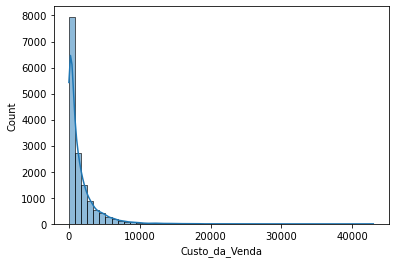

In [29]:
# Podemos perceber que o custo de venda de produtos com menores preços são bem maiores que os produtos mais caros.
sns.histplot(df['Custo_da_Venda'], bins=50, kde=True)

# Vimos que a maioria dos Fabricantes tiveram seus valores de vendas proprocional ao lucro obtido e que a loja própria numto todo é o forte de vendas.

<AxesSubplot:xlabel='Custo_da_Venda', ylabel='Lucro'>

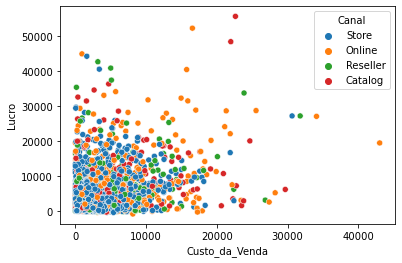

In [56]:
sns.scatterplot(data=df, x= 'Custo_da_Venda', y= 'Lucro', hue = 'Canal')

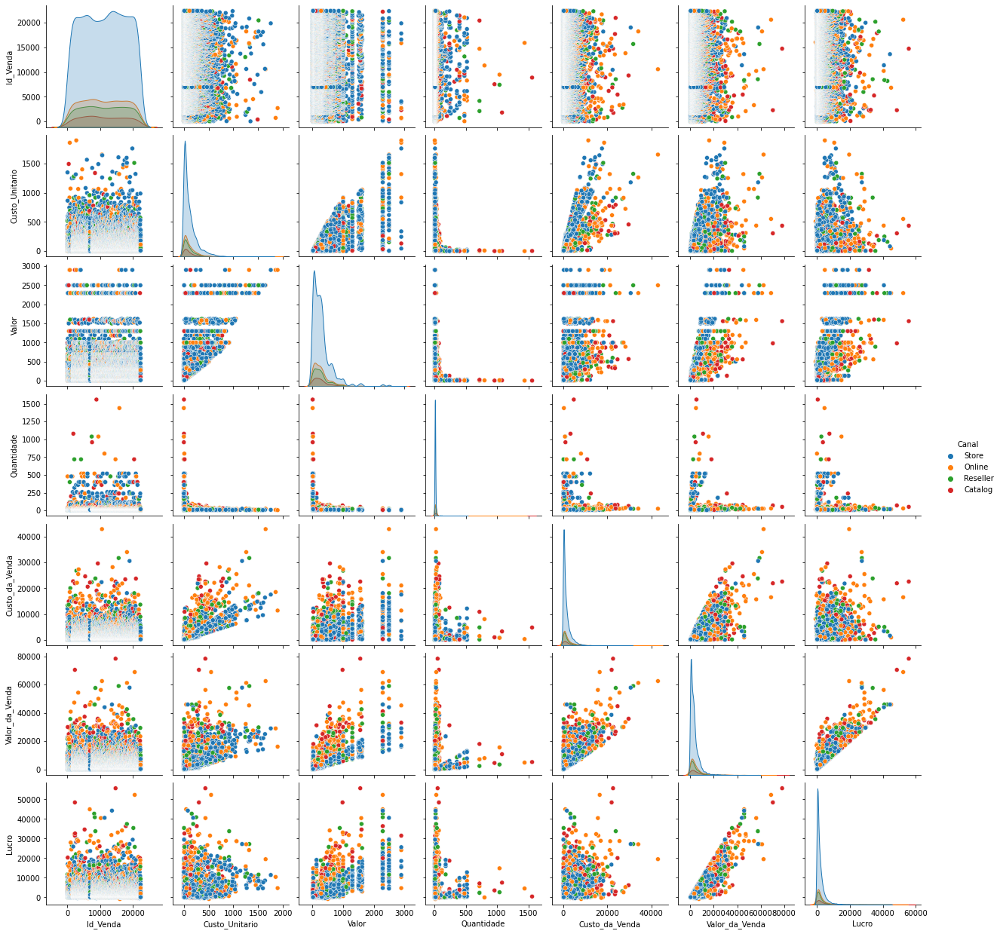

In [31]:
sns.pairplot(df, hue= 'Canal')

In [ ]:
# Resultado final das análises realizadas.

- Aparentemente o continente um Fabricante é o que mais possui vendas e é do continente Norte Americano
- O Continente Amaricano é o que mais possui Loja física "Store" onde se solidifica as maiores vendas
- O Páis que mais vendeu de todos foi o EUA
- Promoção em produtos não teve grande relevância para nenhum continente
- A grande maioria das vendas são de produtos como: Computadores, Celulares , Tv e Câmeras nas lojas físicas

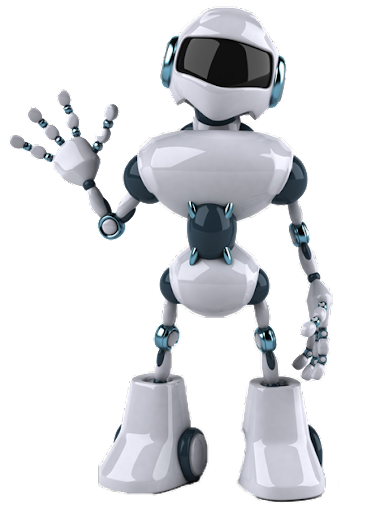